In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [4]:
# importlib.reload(params) #####
importlib.reload(strategies) #####

first_day = df_inds_test.index.normalize().min()
start_ask = df_inds_test.loc[df_inds_test.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick
sess_start = params.sess_start_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = sess_start
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = sess_start
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/622 [00:00<?, ?it/s]

Loop finished. Days simulated: 622



                                                  ******* Performance for 2024-05-01 *******

INTRADAY:
  shares(638); [ask_buy=170.034, fee_buy=0.004, pos_amnt_buy=108484.244]; [bid_sell=169.456, fee_sell=0.018, pos_amnt_sell=108101.58]; leftover=155.158; PNL=-382.664
TRADES:
  Tr[1]: Time(14:31)Ask(169.784)Bid(169.716)Act(Sell)Shrs(4)Pos(726); CashTr(678.793)=Cost(678.864)-Fee(-0.072); P&L(127811.012)=CashTot(4597.16)+PosAmt(123213.852)
  Tr[2]: Time(14:34)Ask(169.145)Bid(169.077)Act(Sell)Shrs(5)Pos(721); CashTr(845.296)=Cost(845.385)-Fee(-0.089); P&L(127347.029)=CashTot(5442.456)+PosAmt(121904.573)
  Tr[3]: Time(14:43)Ask(170.014)Bid(169.946)Act(Buy)Shrs(1)Pos(722); CashTr(-170.018)=Cost(-170.014)-Fee(-0.004); P&L(127973.453)=CashTot(5272.438)+PosAmt(122701.015)
  Tr[4]: Time(14:44)Ask(170.284)Bid(170.216)Act(Buy)Shrs(1)Pos(723); CashTr(-170.288)=Cost(-170.284)-Fee(-0.004); P&L(128168.282)=CashTot(5102.15)+PosAmt(123066.132)
  Tr[5]: Time(14:45)Ask(170.389)Bid(170.321)Act(Buy)Shrs(


                                                  ******* Performance for 2024-05-02 *******

INTRADAY:
  shares(628); [ask_buy=172.164, fee_buy=0.004, pos_amnt_buy=108121.772]; [bid_sell=173.365, fee_sell=0.018, pos_amnt_sell=108862.13]; leftover=134.966; PNL=740.359
TRADES:
  Tr[1]: Time(14:30)Ask(172.164)Bid(172.096)Act(Buy)Shrs(1)Pos(725); CashTr(-172.168)=Cost(-172.164)-Fee(-0.004); P&L(129524.53)=CashTot(4755.239)+PosAmt(124769.291)
  Tr[2]: Time(14:31)Ask(171.574)Bid(171.506)Act(Buy)Shrs(1)Pos(726); CashTr(-171.578)=Cost(-171.574)-Fee(-0.004); P&L(129096.793)=CashTot(4583.661)+PosAmt(124513.132)
  Tr[3]: Time(14:32)Ask(171.694)Bid(171.626)Act(Buy)Shrs(1)Pos(727); CashTr(-171.698)=Cost(-171.694)-Fee(-0.004); P&L(129183.823)=CashTot(4411.962)+PosAmt(124771.861)
  Tr[4]: Time(14:33)Ask(172.334)Bid(172.266)Act(Buy)Shrs(1)Pos(728); CashTr(-172.338)=Cost(-172.334)-Fee(-0.004); P&L(129648.937)=CashTot(4239.624)+PosAmt(125409.313)
  Tr[5]: Time(14:34)Ask(171.994)Bid(171.926)Act(Buy)Shr


                                                  ******* Performance for 2024-05-03 *******

INTRADAY:
  shares(586); [ask_buy=185.907, fee_buy=0.004, pos_amnt_buy=108943.948]; [bid_sell=183.203, fee_sell=0.018, pos_amnt_sell=107346.086]; leftover=53.148; PNL=-1597.862
TRADES:
  Tr[1]: Time(14:30)Ask(185.907)Bid(185.833)Act(Buy)Shrs(1)Pos(750); CashTr(-185.911)=Cost(-185.907)-Fee(-0.004); P&L(139815.663)=CashTot(441.044)+PosAmt(139374.62)
  Tr[2]: Time(14:35)Ask(185.127)Bid(185.053)Act(Sell)Shrs(4)Pos(746); CashTr(740.139)=Cost(740.212)-Fee(-0.073); P&L(139230.707)=CashTot(1181.183)+PosAmt(138049.525)
  Tr[3]: Time(14:41)Ask(184.107)Bid(184.033)Act(Sell)Shrs(6)Pos(740); CashTr(1104.09)=Cost(1104.199)-Fee(-0.109); P&L(138469.83)=CashTot(2285.273)+PosAmt(136184.558)
  Tr[4]: Time(14:59)Ask(184.152)Bid(184.078)Act(Sell)Shrs(5)Pos(735); CashTr(920.3)=Cost(920.391)-Fee(-0.091); P&L(138503.032)=CashTot(3205.572)+PosAmt(135297.46)
  Tr[5]: Time(15:01)Ask(183.387)Bid(183.313)Act(Sell)Shrs(5)


                                                  ******* Performance for 2024-05-06 *******

INTRADAY:
  shares(587); [ask_buy=182.797, fee_buy=0.004, pos_amnt_buy=107303.924]; [bid_sell=181.484, fee_sell=0.018, pos_amnt_sell=106520.267]; leftover=95.31; PNL=-783.657
TRADES:
  Tr[1]: Time(14:30)Ask(182.797)Bid(182.723)Act(Sell)Shrs(4)Pos(723); CashTr(730.821)=Cost(730.894)-Fee(-0.073); P&L(137494.295)=CashTot(5385.242)+PosAmt(132109.053)
  Tr[2]: Time(14:31)Ask(183.417)Bid(183.343)Act(Buy)Shrs(1)Pos(724); CashTr(-183.421)=Cost(-183.417)-Fee(-0.004); P&L(137942.388)=CashTot(5201.822)+PosAmt(132740.567)
  Tr[3]: Time(14:32)Ask(183.827)Bid(183.753)Act(Buy)Shrs(1)Pos(725); CashTr(-183.831)=Cost(-183.827)-Fee(-0.004); P&L(138239.091)=CashTot(5017.991)+PosAmt(133221.1)
  Tr[4]: Time(14:33)Ask(184.022)Bid(183.948)Act(Buy)Shrs(1)Pos(726); CashTr(-184.026)=Cost(-184.022)-Fee(-0.004); P&L(138380.361)=CashTot(4833.965)+PosAmt(133546.395)
  Tr[5]: Time(14:34)Ask(183.357)Bid(183.283)Act(Buy)Shrs(


                                                  ******* Performance for 2024-05-07 *******

INTRADAY:
  shares(579); [ask_buy=183.877, fee_buy=0.004, pos_amnt_buy=106466.965]; [bid_sell=182.703, fee_sell=0.018, pos_amnt_sell=105774.765]; leftover=148.612; PNL=-692.2
TRADES:
  Tr[1]: Time(14:58)Ask(184.067)Bid(183.993)Act(Sell)Shrs(4)Pos(748); CashTr(735.9)=Cost(735.973)-Fee(-0.073); P&L(138455.74)=CashTot(828.831)+PosAmt(137626.909)
  Tr[2]: Time(15:12)Ask(183.367)Bid(183.293)Act(Sell)Shrs(5)Pos(743); CashTr(916.376)=Cost(916.467)-Fee(-0.091); P&L(137932.154)=CashTot(1745.207)+PosAmt(136186.947)
  Tr[3]: Time(15:18)Ask(184.083)Bid(184.009)Act(Buy)Shrs(1)Pos(744); CashTr(-184.087)=Cost(-184.083)-Fee(-0.004); P&L(138463.735)=CashTot(1561.12)+PosAmt(136902.615)
  Tr[4]: Time(15:19)Ask(184.127)Bid(184.053)Act(Buy)Shrs(1)Pos(745); CashTr(-184.131)=Cost(-184.127)-Fee(-0.004); P&L(138496.536)=CashTot(1376.99)+PosAmt(137119.546)
  Tr[5]: Time(15:20)Ask(184.483)Bid(184.409)Act(Buy)Shrs(1)Pos


                                                  ******* Performance for 2024-05-08 *******

INTRADAY:
  shares(579); [ask_buy=182.817, fee_buy=0.004, pos_amnt_buy=105853.102]; [bid_sell=182.783, fee_sell=0.018, pos_amnt_sell=105821.075]; leftover=70.275; PNL=-32.027
TRADES:
  Tr[1]: Time(14:37)Ask(182.491)Bid(182.419)Act(Sell)Shrs(4)Pos(748); CashTr(729.601)=Cost(729.674)-Fee(-0.073); P&L(137278.904)=CashTot(829.859)+PosAmt(136449.045)
  Tr[2]: Time(15:07)Ask(181.77)Bid(181.697)Act(Sell)Shrs(5)Pos(743); CashTr(908.395)=Cost(908.486)-Fee(-0.091); P&L(136739.239)=CashTot(1738.254)+PosAmt(135000.985)
  Tr[3]: Time(15:28)Ask(182.023)Bid(181.95)Act(Buy)Shrs(1)Pos(744); CashTr(-182.027)=Cost(-182.023)-Fee(-0.004); P&L(136927.178)=CashTot(1556.227)+PosAmt(135370.951)
  Tr[4]: Time(15:45)Ask(182.006)Bid(181.934)Act(Buy)Shrs(1)Pos(745); CashTr(-182.01)=Cost(-182.006)-Fee(-0.004); P&L(136914.753)=CashTot(1374.217)+PosAmt(135540.536)
  Tr[5]: Time(15:46)Ask(181.996)Bid(181.924)Act(Buy)Shrs(1)P


                                                  ******* Performance for 2024-05-09 *******

INTRADAY:
  shares(579); [ask_buy=182.717, fee_buy=0.004, pos_amnt_buy=105795.19]; [bid_sell=184.473, fee_sell=0.018, pos_amnt_sell=106799.367]; leftover=96.16; PNL=1004.176
TRADES:
  Tr[1]: Time(14:31)Ask(182.206)Bid(182.134)Act(Sell)Shrs(5)Pos(747); CashTr(910.577)=Cost(910.668)-Fee(-0.091); P&L(137063.771)=CashTot(1009.997)+PosAmt(136053.774)
  Tr[2]: Time(14:36)Ask(183.072)Bid(182.999)Act(Buy)Shrs(1)Pos(748); CashTr(-183.076)=Cost(-183.072)-Fee(-0.004); P&L(137710.018)=CashTot(826.921)+PosAmt(136883.097)
  Tr[3]: Time(14:37)Ask(183.257)Bid(183.183)Act(Buy)Shrs(1)Pos(749); CashTr(-183.261)=Cost(-183.257)-Fee(-0.004); P&L(137847.994)=CashTot(643.66)+PosAmt(137204.334)
  Tr[4]: Time(14:38)Ask(183.217)Bid(183.143)Act(Buy)Shrs(1)Pos(750); CashTr(-183.221)=Cost(-183.217)-Fee(-0.004); P&L(137817.963)=CashTot(460.44)+PosAmt(137357.523)
  Tr[5]: Time(14:39)Ask(182.967)Bid(182.893)Act(Buy)Shrs(1)Po


                                                  ******* Performance for 2024-05-10 *******

INTRADAY:
  shares(578); [ask_buy=184.647, fee_buy=0.004, pos_amnt_buy=106728.233]; [bid_sell=183.013, fee_sell=0.018, pos_amnt_sell=105771.22]; leftover=167.293; PNL=-957.013
TRADES:
  Tr[1]: Time(14:36)Ask(184.222)Bid(184.148)Act(Sell)Shrs(5)Pos(747); CashTr(920.65)=Cost(920.741)-Fee(-0.091); P&L(138571.849)=CashTot(1013.171)+PosAmt(137558.678)
  Tr[2]: Time(14:46)Ask(183.727)Bid(183.653)Act(Sell)Shrs(5)Pos(742); CashTr(918.175)=Cost(918.266)-Fee(-0.091); P&L(138202.067)=CashTot(1931.346)+PosAmt(136270.72)
  Tr[3]: Time(15:26)Ask(183.265)Bid(183.192)Act(Sell)Shrs(5)Pos(737); CashTr(915.867)=Cost(915.958)-Fee(-0.091); P&L(137859.463)=CashTot(2847.213)+PosAmt(135012.249)
  Tr[4]: Time(15:51)Ask(182.577)Bid(182.504)Act(Sell)Shrs(5)Pos(732); CashTr(912.427)=Cost(912.518)-Fee(-0.091); P&L(137352.27)=CashTot(3759.64)+PosAmt(133592.629)
  Tr[5]: Time(16:12)Ask(182.852)Bid(182.778)Act(Buy)Shrs(1)Po


                                                  ******* Performance for 2024-05-13 *******

INTRADAY:
  shares(571); [ask_buy=185.222, fee_buy=0.004, pos_amnt_buy=105764.067]; [bid_sell=186.173, fee_sell=0.018, pos_amnt_sell=106294.211]; leftover=174.446; PNL=530.144
TRADES:
  Tr[1]: Time(14:32)Ask(185.056)Bid(184.982)Act(Sell)Shrs(4)Pos(748); CashTr(739.855)=Cost(739.928)-Fee(-0.073); P&L(139212.795)=CashTot(846.188)+PosAmt(138366.608)
  Tr[2]: Time(14:47)Ask(185.282)Bid(185.208)Act(Buy)Shrs(1)Pos(749); CashTr(-185.286)=Cost(-185.282)-Fee(-0.004); P&L(139381.657)=CashTot(660.901)+PosAmt(138720.755)
  Tr[3]: Time(14:55)Ask(185.302)Bid(185.228)Act(Buy)Shrs(1)Pos(750); CashTr(-185.306)=Cost(-185.302)-Fee(-0.004); P&L(139396.556)=CashTot(475.595)+PosAmt(138920.96)
  Tr[4]: Time(14:56)Ask(185.247)Bid(185.173)Act(Buy)Shrs(1)Pos(751); CashTr(-185.251)=Cost(-185.247)-Fee(-0.004); P&L(139355.236)=CashTot(290.344)+PosAmt(139064.891)
  Tr[5]: Time(14:57)Ask(185.247)Bid(185.173)Act(Buy)Shrs(1)


                                                  ******* Performance for 2024-05-14 *******

INTRADAY:
  shares(565); [ask_buy=188.208, fee_buy=0.004, pos_amnt_buy=106339.573]; [bid_sell=187.303, fee_sell=0.018, pos_amnt_sell=105815.592]; leftover=129.084; PNL=-523.981
TRADES:
  Tr[1]: Time(14:30)Ask(188.208)Bid(188.132)Act(Buy)Shrs(1)Pos(748); CashTr(-188.212)=Cost(-188.208)-Fee(-0.004); P&L(141571.189)=CashTot(848.179)+PosAmt(140723.01)
  Tr[2]: Time(14:31)Ask(187.738)Bid(187.662)Act(Buy)Shrs(1)Pos(749); CashTr(-187.742)=Cost(-187.738)-Fee(-0.004); P&L(141219.62)=CashTot(660.437)+PosAmt(140559.183)
  Tr[3]: Time(14:32)Ask(187.718)Bid(187.642)Act(Buy)Shrs(1)Pos(750); CashTr(-187.722)=Cost(-187.718)-Fee(-0.004); P&L(141204.564)=CashTot(472.716)+PosAmt(140731.848)
  Tr[4]: Time(14:33)Ask(187.477)Bid(187.403)Act(Buy)Shrs(1)Pos(751); CashTr(-187.481)=Cost(-187.477)-Fee(-0.004); P&L(141024.521)=CashTot(285.234)+PosAmt(140739.287)
  Tr[5]: Time(14:34)Ask(187.568)Bid(187.492)Act(Buy)Shrs(1


                                                  ******* Performance for 2024-05-15 *******

INTRADAY:
  shares(561); [ask_buy=188.608, fee_buy=0.004, pos_amnt_buy=105811.172]; [bid_sell=189.612, fee_sell=0.018, pos_amnt_sell=106362.076]; leftover=133.505; PNL=550.905
TRADES:
  Tr[1]: Time(14:34)Ask(187.738)Bid(187.662)Act(Sell)Shrs(4)Pos(748); CashTr(750.577)=Cost(750.65)-Fee(-0.073); P&L(141215.295)=CashTot(843.775)+PosAmt(140371.52)
  Tr[2]: Time(14:41)Ask(188.148)Bid(188.072)Act(Buy)Shrs(1)Pos(749); CashTr(-188.152)=Cost(-188.148)-Fee(-0.004); P&L(141521.834)=CashTot(655.623)+PosAmt(140866.211)
  Tr[3]: Time(14:42)Ask(188.243)Bid(188.167)Act(Buy)Shrs(1)Pos(750); CashTr(-188.247)=Cost(-188.243)-Fee(-0.004); P&L(141592.896)=CashTot(467.376)+PosAmt(141125.519)
  Tr[4]: Time(14:43)Ask(188.153)Bid(188.077)Act(Buy)Shrs(1)Pos(751); CashTr(-188.157)=Cost(-188.153)-Fee(-0.004); P&L(141525.33)=CashTot(279.22)+PosAmt(141246.11)
  Tr[5]: Time(14:47)Ask(188.318)Bid(188.242)Act(Buy)Shrs(1)Pos(


                                                  ******* Performance for 2024-05-16 *******

INTRADAY:
  shares(558); [ask_buy=190.553, fee_buy=0.004, pos_amnt_buy=106330.863]; [bid_sell=189.692, fee_sell=0.018, pos_amnt_sell=105837.925]; leftover=164.718; PNL=-492.938
TRADES:
  Tr[1]: Time(14:42)Ask(190.108)Bid(190.032)Act(Sell)Shrs(4)Pos(748); CashTr(760.055)=Cost(760.128)-Fee(-0.073); P&L(142993.879)=CashTot(849.953)+PosAmt(142143.926)
  Tr[2]: Time(14:48)Ask(190.548)Bid(190.472)Act(Buy)Shrs(1)Pos(749); CashTr(-190.552)=Cost(-190.548)-Fee(-0.004); P&L(143322.852)=CashTot(659.401)+PosAmt(142663.452)
  Tr[3]: Time(14:49)Ask(190.773)Bid(190.697)Act(Buy)Shrs(1)Pos(750); CashTr(-190.777)=Cost(-190.773)-Fee(-0.004); P&L(143491.263)=CashTot(468.624)+PosAmt(143022.64)
  Tr[4]: Time(14:50)Ask(190.858)Bid(190.782)Act(Buy)Shrs(1)Pos(751); CashTr(-190.862)=Cost(-190.858)-Fee(-0.004); P&L(143554.92)=CashTot(277.762)+PosAmt(143277.159)
  Tr[5]: Time(14:51)Ask(190.943)Bid(190.867)Act(Buy)Shrs(1)


                                                  ******* Performance for 2024-05-17 *******

INTRADAY:
  shares(558); [ask_buy=189.813, fee_buy=0.004, pos_amnt_buy=105917.638]; [bid_sell=189.892, fee_sell=0.018, pos_amnt_sell=105949.5]; leftover=85.005; PNL=31.863
TRADES:
  Tr[1]: Time(15:18)Ask(190.048)Bid(189.972)Act(Sell)Shrs(5)Pos(747); CashTr(949.768)=Cost(949.86)-Fee(-0.092); P&L(142942.101)=CashTot(1033.019)+PosAmt(141909.083)
  Tr[2]: Time(15:33)Ask(190.278)Bid(190.202)Act(Buy)Shrs(1)Pos(748); CashTr(-190.282)=Cost(-190.278)-Fee(-0.004); P&L(143113.797)=CashTot(842.737)+PosAmt(142271.06)
  Tr[3]: Time(15:34)Ask(190.328)Bid(190.252)Act(Buy)Shrs(1)Pos(749); CashTr(-190.332)=Cost(-190.328)-Fee(-0.004); P&L(143151.109)=CashTot(652.405)+PosAmt(142498.705)
  Tr[4]: Time(15:35)Ask(190.278)Bid(190.202)Act(Buy)Shrs(1)Pos(750); CashTr(-190.282)=Cost(-190.278)-Fee(-0.004); P&L(143113.512)=CashTot(462.123)+PosAmt(142651.389)
  Tr[5]: Time(15:36)Ask(190.207)Bid(190.131)Act(Buy)Shrs(1)Pos(


                                                  ******* Performance for 2024-05-20 *******

INTRADAY:
  shares(560); [ask_buy=189.188, fee_buy=0.004, pos_amnt_buy=105947.425]; [bid_sell=191.092, fee_sell=0.018, pos_amnt_sell=107001.098]; leftover=87.081; PNL=1053.673
TRADES:
  Tr[1]: Time(14:30)Ask(189.188)Bid(189.112)Act(Sell)Shrs(4)Pos(748); CashTr(756.375)=Cost(756.449)-Fee(-0.073); P&L(142293.312)=CashTot(837.409)+PosAmt(141455.903)
  Tr[2]: Time(14:31)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(749); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(142741.943)=CashTot(647.617)+PosAmt(142094.325)
  Tr[3]: Time(14:32)Ask(189.758)Bid(189.682)Act(Buy)Shrs(1)Pos(750); CashTr(-189.762)=Cost(-189.758)-Fee(-0.004); P&L(142719.397)=CashTot(457.855)+PosAmt(142261.542)
  Tr[4]: Time(14:33)Ask(189.663)Bid(189.587)Act(Buy)Shrs(1)Pos(751); CashTr(-189.667)=Cost(-189.663)-Fee(-0.004); P&L(142648.082)=CashTot(268.188)+PosAmt(142379.893)
  Tr[5]: Time(14:34)Ask(189.766)Bid(189.691)Act(Buy)Shrs(1


                                                  ******* Performance for 2024-05-21 *******

INTRADAY:
  shares(560); [ask_buy=191.098, fee_buy=0.004, pos_amnt_buy=107016.847]; [bid_sell=192.292, fee_sell=0.018, pos_amnt_sell=107672.948]; leftover=71.332; PNL=656.101
TRADES:
  Tr[1]: Time(17:06)Ask(191.918)Bid(191.842)Act(Sell)Shrs(5)Pos(747); CashTr(959.116)=Cost(959.208)-Fee(-0.092); P&L(144340.173)=CashTot(1034.48)+PosAmt(143305.693)
  Tr[2]: Time(17:19)Ask(192.128)Bid(192.051)Act(Buy)Shrs(1)Pos(748); CashTr(-192.132)=Cost(-192.128)-Fee(-0.004); P&L(144496.856)=CashTot(842.347)+PosAmt(143654.509)
  Tr[3]: Time(17:24)Ask(192.148)Bid(192.072)Act(Buy)Shrs(1)Pos(749); CashTr(-192.152)=Cost(-192.148)-Fee(-0.004); P&L(144511.807)=CashTot(650.195)+PosAmt(143861.612)
  Tr[4]: Time(17:28)Ask(192.187)Bid(192.11)Act(Buy)Shrs(1)Pos(750); CashTr(-192.191)=Cost(-192.187)-Fee(-0.004); P&L(144540.257)=CashTot(458.004)+PosAmt(144082.253)
  Tr[5]: Time(17:29)Ask(192.218)Bid(192.141)Act(Buy)Shrs(1)P


                                                  ******* Performance for 2024-05-22 *******

INTRADAY:
  shares(560); [ask_buy=192.228, fee_buy=0.004, pos_amnt_buy=107650.165]; [bid_sell=191.042, fee_sell=0.018, pos_amnt_sell=106973.104]; leftover=94.115; PNL=-677.061
TRADES:
  Tr[1]: Time(15:59)Ask(192.118)Bid(192.042)Act(Sell)Shrs(5)Pos(747); CashTr(960.116)=Cost(960.208)-Fee(-0.092); P&L(144488.754)=CashTot(1033.691)+PosAmt(143455.063)
  Tr[2]: Time(17:17)Ask(191.608)Bid(191.531)Act(Sell)Shrs(4)Pos(743); CashTr(766.052)=Cost(766.126)-Fee(-0.074); P&L(144107.638)=CashTot(1799.744)+PosAmt(142307.894)
  Tr[3]: Time(17:40)Ask(191.718)Bid(191.642)Act(Buy)Shrs(1)Pos(744); CashTr(-191.722)=Cost(-191.718)-Fee(-0.004); P&L(144189.419)=CashTot(1608.021)+PosAmt(142581.398)
  Tr[4]: Time(18:17)Ask(191.363)Bid(191.287)Act(Buy)Shrs(1)Pos(745); CashTr(-191.367)=Cost(-191.363)-Fee(-0.004); P&L(143925.272)=CashTot(1416.654)+PosAmt(142508.618)
  Tr[5]: Time(18:18)Ask(191.443)Bid(191.367)Act(Buy)Shr


                                                  ******* Performance for 2024-05-23 *******

INTRADAY:
  shares(562); [ask_buy=190.208, fee_buy=0.004, pos_amnt_buy=106899.163]; [bid_sell=186.763, fee_sell=0.018, pos_amnt_sell=104950.327]; leftover=168.056; PNL=-1948.836
TRADES:
  Tr[1]: Time(14:30)Ask(190.208)Bid(190.132)Act(Sell)Shrs(5)Pos(743); CashTr(950.568)=Cost(950.66)-Fee(-0.092); P&L(143053.252)=CashTot(1785.201)+PosAmt(141268.051)
  Tr[2]: Time(14:42)Ask(189.918)Bid(189.842)Act(Sell)Shrs(5)Pos(738); CashTr(949.119)=Cost(949.211)-Fee(-0.092); P&L(142837.807)=CashTot(2734.32)+PosAmt(140103.487)
  Tr[3]: Time(14:53)Ask(189.228)Bid(189.152)Act(Sell)Shrs(5)Pos(733); CashTr(945.669)=Cost(945.761)-Fee(-0.092); P&L(142328.524)=CashTot(3679.989)+PosAmt(138648.535)
  Tr[4]: Time(15:08)Ask(188.808)Bid(188.732)Act(Sell)Shrs(5)Pos(728); CashTr(943.57)=Cost(943.661)-Fee(-0.092); P&L(142020.634)=CashTot(4623.559)+PosAmt(137397.075)
  Tr[5]: Time(15:31)Ask(189.086)Bid(189.01)Act(Buy)Shrs(1)


                                                  ******* Performance for 2024-05-24 *******

INTRADAY:
  shares(557); [ask_buy=188.658, fee_buy=0.004, pos_amnt_buy=105084.58]; [bid_sell=189.922, fee_sell=0.018, pos_amnt_sell=105776.333]; leftover=33.802; PNL=691.753
TRADES:
  Tr[1]: Time(14:30)Ask(188.658)Bid(188.582)Act(Buy)Shrs(1)Pos(748); CashTr(-188.662)=Cost(-188.658)-Fee(-0.004); P&L(141886.698)=CashTot(827.156)+PosAmt(141059.542)
  Tr[2]: Time(14:31)Ask(188.678)Bid(188.602)Act(Buy)Shrs(1)Pos(749); CashTr(-188.682)=Cost(-188.678)-Fee(-0.004); P&L(141901.576)=CashTot(638.474)+PosAmt(141263.102)
  Tr[3]: Time(14:32)Ask(188.837)Bid(188.761)Act(Buy)Shrs(1)Pos(750); CashTr(-188.841)=Cost(-188.837)-Fee(-0.004); P&L(142020.563)=CashTot(449.633)+PosAmt(141570.93)
  Tr[4]: Time(14:33)Ask(188.977)Bid(188.902)Act(Buy)Shrs(1)Pos(751); CashTr(-188.981)=Cost(-188.977)-Fee(-0.004); P&L(142125.763)=CashTot(260.652)+PosAmt(141865.111)
  Tr[5]: Time(14:34)Ask(189.148)Bid(189.072)Act(Buy)Shrs(1)P


                                                  ******* Performance for 2024-05-28 *******

INTRADAY:
  shares(552); [ask_buy=191.443, fee_buy=0.004, pos_amnt_buy=105678.899]; [bid_sell=190.112, fee_sell=0.018, pos_amnt_sell=104931.671]; leftover=131.236; PNL=-747.228
TRADES:
  Tr[1]: Time(14:30)Ask(191.443)Bid(191.367)Act(Sell)Shrs(6)Pos(742); CashTr(1148.09)=Cost(1148.2)-Fee(-0.11); P&L(143970.8)=CashTot(1976.694)+PosAmt(141994.105)
  Tr[2]: Time(14:39)Ask(192.759)Bid(192.681)Act(Buy)Shrs(1)Pos(743); CashTr(-192.763)=Cost(-192.759)-Fee(-0.004); P&L(144946.253)=CashTot(1783.931)+PosAmt(143162.322)
  Tr[3]: Time(14:40)Ask(192.513)Bid(192.437)Act(Buy)Shrs(1)Pos(744); CashTr(-192.517)=Cost(-192.513)-Fee(-0.004); P&L(144764.174)=CashTot(1591.414)+PosAmt(143172.76)
  Tr[4]: Time(14:41)Ask(192.518)Bid(192.442)Act(Buy)Shrs(1)Pos(745); CashTr(-192.522)=Cost(-192.518)-Fee(-0.004); P&L(144767.812)=CashTot(1398.891)+PosAmt(143368.92)
  Tr[5]: Time(14:43)Ask(191.943)Bid(191.867)Act(Sell)Shrs(4


                                                  ******* Performance for 2024-05-29 *******

INTRADAY:
  shares(552); [ask_buy=190.218, fee_buy=0.004, pos_amnt_buy=105002.564]; [bid_sell=190.252, fee_sell=0.018, pos_amnt_sell=105008.934]; leftover=60.344; PNL=6.37
TRADES:
  Tr[1]: Time(14:31)Ask(189.818)Bid(189.742)Act(Sell)Shrs(5)Pos(747); CashTr(948.618)=Cost(948.71)-Fee(-0.092); P&L(142728.167)=CashTot(990.861)+PosAmt(141737.307)
  Tr[2]: Time(14:33)Ask(190.583)Bid(190.507)Act(Buy)Shrs(1)Pos(748); CashTr(-190.587)=Cost(-190.583)-Fee(-0.004); P&L(143299.428)=CashTot(800.273)+PosAmt(142499.154)
  Tr[3]: Time(14:34)Ask(190.638)Bid(190.562)Act(Buy)Shrs(1)Pos(749); CashTr(-190.642)=Cost(-190.638)-Fee(-0.004); P&L(143340.479)=CashTot(609.631)+PosAmt(142730.848)
  Tr[4]: Time(14:35)Ask(190.678)Bid(190.602)Act(Buy)Shrs(1)Pos(750); CashTr(-190.682)=Cost(-190.678)-Fee(-0.004); P&L(143370.353)=CashTot(418.949)+PosAmt(142951.404)
  Tr[5]: Time(14:36)Ask(190.888)Bid(190.812)Act(Buy)Shrs(1)Pos(


                                                  ******* Performance for 2024-05-30 *******

INTRADAY:
  shares(549); [ask_buy=191.119, fee_buy=0.004, pos_amnt_buy=104926.701]; [bid_sell=191.262, fee_sell=0.018, pos_amnt_sell=104992.6]; leftover=142.577; PNL=65.899
TRADES:
  Tr[1]: Time(14:30)Ask(191.119)Bid(191.043)Act(Buy)Shrs(1)Pos(747); CashTr(-191.123)=Cost(-191.119)-Fee(-0.004); P&L(143695.598)=CashTot(986.563)+PosAmt(142709.034)
  Tr[2]: Time(14:31)Ask(191.074)Bid(190.998)Act(Buy)Shrs(1)Pos(748); CashTr(-191.078)=Cost(-191.074)-Fee(-0.004); P&L(143661.76)=CashTot(795.485)+PosAmt(142866.274)
  Tr[3]: Time(14:32)Ask(191.322)Bid(191.245)Act(Buy)Shrs(1)Pos(749); CashTr(-191.326)=Cost(-191.322)-Fee(-0.004); P&L(143846.847)=CashTot(604.16)+PosAmt(143242.687)
  Tr[4]: Time(14:33)Ask(191.338)Bid(191.262)Act(Buy)Shrs(1)Pos(750); CashTr(-191.342)=Cost(-191.338)-Fee(-0.004); P&L(143859.122)=CashTot(412.817)+PosAmt(143446.305)
  Tr[5]: Time(14:34)Ask(191.398)Bid(191.322)Act(Buy)Shrs(1)Pos


                                                  ******* Performance for 2024-05-31 *******

INTRADAY:
  shares(547); [ask_buy=191.933, fee_buy=0.004, pos_amnt_buy=104989.746]; [bid_sell=192.292, fee_sell=0.018, pos_amnt_sell=105173.397]; leftover=145.43; PNL=183.651
TRADES:
  Tr[1]: Time(14:31)Ask(192.308)Bid(192.232)Act(Buy)Shrs(1)Pos(748); CashTr(-192.312)=Cost(-192.308)-Fee(-0.004); P&L(144578.812)=CashTot(789.616)+PosAmt(143789.196)
  Tr[2]: Time(14:32)Ask(192.178)Bid(192.102)Act(Buy)Shrs(1)Pos(749); CashTr(-192.182)=Cost(-192.178)-Fee(-0.004); P&L(144481.511)=CashTot(597.433)+PosAmt(143884.077)
  Tr[3]: Time(14:37)Ask(192.028)Bid(191.952)Act(Buy)Shrs(1)Pos(750); CashTr(-192.032)=Cost(-192.028)-Fee(-0.004); P&L(144369.102)=CashTot(405.401)+PosAmt(143963.701)
  Tr[4]: Time(14:39)Ask(192.093)Bid(192.017)Act(Buy)Shrs(1)Pos(751); CashTr(-192.097)=Cost(-192.093)-Fee(-0.004); P&L(144417.762)=CashTot(213.304)+PosAmt(144204.458)
  Tr[5]: Time(14:40)Ask(192.373)Bid(192.297)Act(Buy)Shrs(1

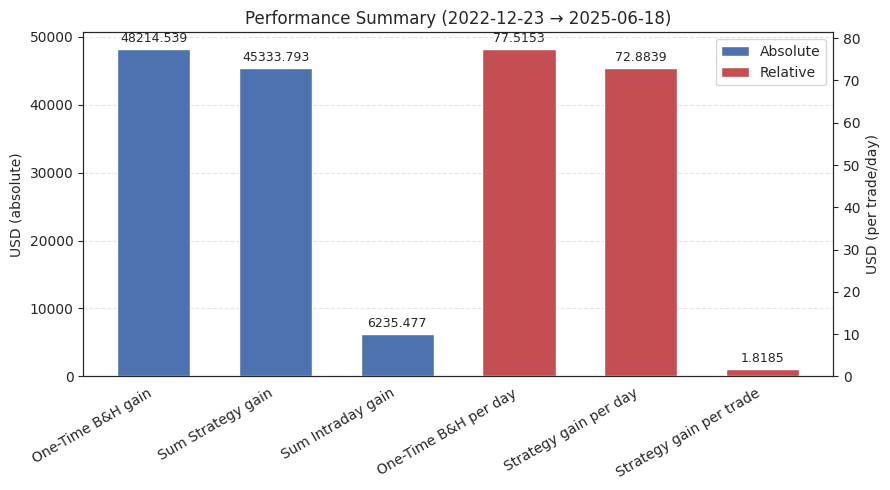

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2022-12 (2022-12-23 = 132.533 → 2022-12-30 = 129.814)
Num. trading days: 5  Trades Count: 556
One-Time B&H gain: -2066.049 | start: 100000.000 | final: 97933.951 | PnL%: -2.07%
Sum Strategy gain: -2334.319 | start: 100000.000 | final: 97665.681 | PnL%: -2.33%
Sum Intraday gain: -1097.078 | start: 100000.000 | final: 98902.922 | PnL%: -1.10%

Monthly Summary 2023-01 (2023-01-03 = 129.814 → 2023-01-31 = 144.151)
Num. trading days: 20  Trades Count: 1096
One-Time B&H gain: 10809.949 | start: 97933.951 | final: 108743.900 | PnL%: 11.04%
Sum Strategy gain: 11745.643 | start: 97665.681 | final: 109411.324 | PnL%: 12.03%
Sum Intraday gain: 9380.434 | start: 98902.922 | final: 108283.356 | PnL%: 9.48%

Monthly Summary 2023-02 (2023-02-01 = 144.151 → 2023-02-28 = 147.361)
Num. trading days: 19  Trades Count: 998
One-Time B&H gain: 2419.801 | start: 108743.900 | final: 111163.701 | PnL%: 2.23%
Sum Strategy ga

In [5]:
importlib.reload(params) ######
# importlib.reload(strategies) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_at_date,
            performance_stats  = stats_at_date,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "-"*150 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds_test,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
